In [ ]:
!pip install -q tensorflow==2.1

     |████████████████████████████████| 421.8MB 19kB/s 
     |████████████████████████████████| 3.9MB 50.9MB/s 
     |████████████████████████████████| 450kB 51.3MB/s 
     |████████████████████████████████| 51kB 8.5MB/s 
ERROR: tensorflow-probability 0.11.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.


In [ ]:
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow.keras.layers as L
import tensorflow.keras.models as M
from google.colab import drive # Модуль для работы с Google Disk
import zipfile # Библиотека для работы с zip архивами
import os      # Библиотека для работы с фаловой системой 

print(tf.__version__)

2.1.0


In [ ]:
# Проверяем что у нас работает GPU
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
#GPU count and name
!nvidia-smi -L

GPU 0: Tesla P4 (UUID: GPU-52a8f426-c351-155e-2e52-b7c313384af6)


## Load and preprocess MNIST dataset

In [ ]:
#(train_x, train_y), (test_x, test_y) = tf.keras.datasets.mnist.load_data()
#
#train_x = (train_x.reshape(-1, 28*28).astype(np.float32) - 127.5) / 127.5
#
#print(train_x.shape, train_x.dtype)
#print(np.min(train_x), np.max(train_x))

11493376/11490434 [==============================] - 0s 0us/step
(60000, 784) float32
-1.0 1.0


In [ ]:
# Подключаем гугл диск
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Распаковываем архив
# Прописываем путь к файлу с архивом
zip_file = '/content/drive/My Drive/lfw-deepfunneled1.zip'  
z = zipfile.ZipFile(zip_file, 'r')
z.extractall()

# Просмотр результата разархивации
print(os.listdir())

['.config', 'lfw-deepfunneled1', 'drive', 'generator.data-00000-of-00002', 'discriminator.data-00000-of-00002', 'sample_data']


In [ ]:
from os import walk
i=0
all_image_paths = []
dirs = walk('/content/lfw-deepfunneled1')
for path_from_top, subdirs, files in dirs:
    for f in files:
      i+=1
      all_image_paths.append(str(path_from_top) + '/' + str(f))
      if i<=10:
        print (all_image_paths[i-1])

/content/lfw-deepfunneled1/Mario_Dominguez/Mario_Dominguez_0001.jpg
/content/lfw-deepfunneled1/Doris_Roberts/Doris_Roberts_0001.jpg
/content/lfw-deepfunneled1/Doris_Roberts/Doris_Roberts_0003.jpg
/content/lfw-deepfunneled1/Doris_Roberts/Doris_Roberts_0002.jpg
/content/lfw-deepfunneled1/Dan_Ackroyd/Dan_Ackroyd_0001.jpg
/content/lfw-deepfunneled1/Jeffrey_Scott_Postell/Jeffrey_Scott_Postell_0001.jpg
/content/lfw-deepfunneled1/Jeffrey_Scott_Postell/Jeffrey_Scott_Postell_0002.jpg
/content/lfw-deepfunneled1/Jeri_Ryan/Jeri_Ryan_0001.jpg
/content/lfw-deepfunneled1/Kirby_Puckett/Kirby_Puckett_0001.jpg
/content/lfw-deepfunneled1/Carlos_Barragan/Carlos_Barragan_0001.jpg


In [ ]:
def preprocess_image(image):
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.resize(image, [248, 248])
  image /= 255.0  # normalize to [0,1] range

  return image

In [ ]:
def load_and_preprocess_image(path):
  image = tf.io.read_file(path)
  return preprocess_image(image)

In [ ]:
#all_image_paths=['/content/Antonio_Elias_Saca_0001.jpg', '/content/Abbas_Kiarostami_0001.jpg', '/content/Abdel_Nasser_Assidi_0002.jpg']

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
path_ds = tf.data.Dataset.from_tensor_slices(all_image_paths)
image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=AUTOTUNE)

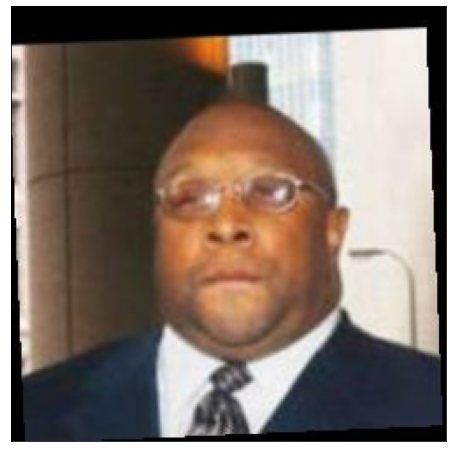

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,8))
for n, image in enumerate(image_ds.take(50)):
 # plt.subplot(1,3,n+1)
  if n==8:
      plt.imshow(image)
      plt.grid(False)
      plt.xticks([])
      plt.yticks([])
      plt.show()

## Draw MNIST examples

In [ ]:
def plot_digits(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        #imt = samples[j, ...].reshape(3, 248, 248)
        #imt = samples[j, ...].reshape(3,248*248)
        #imt = imt.T
        #imt = imt.reshape(248,248,3)*255
       # ax.imshow(imt)

        #ax.imshow(samples[j, ...].reshape(248,248,3)*255.0)
        ax.imshow(np.uint8(samples[j].reshape(248, 248, 3)*255))
        
        plt.xticks([]), plt.yticks([])
    plt.show()
    
#plot_digits(train_x[:32, ...])

## Create GAN parts: Generator and Discriminator

## Training parameters, dataset pipeline, optimizer

## GAN training

## Generator test: random examples

## Generator test: continuous examples

## Deep Convolutional GAN (DCGAN)

In [ ]:
generator = M.Sequential([
    L.Dense(128*62*62, activation="relu"),
    L.Reshape((62,62, 128)),
    L.UpSampling2D((2, 2)),    
    L.Conv2D(128, (3, 3), padding="same"),
    L.BatchNormalization(momentum=0.8),
    L.ReLU(),    
    L.UpSampling2D((2, 2)),    
    L.Conv2D(64, (3, 3), padding="same"),
    L.BatchNormalization(momentum=0.8),
    L.ReLU(),    
    L.Conv2D(3, (3, 3), padding="same", activation='tanh'),
])



discriminator = M.Sequential([
    L.Conv2D(32, (3, 3), strides=(2, 2), padding="same"),
    L.LeakyReLU(0.2),
    L.Dropout(0.25),    
    L.Conv2D(64, kernel_size=3, strides=(2, 2), padding="same"),
    L.ZeroPadding2D(padding=((0, 1), (0, 1))),
    L.BatchNormalization(momentum=0.8),
    L.LeakyReLU(alpha=0.2),
    L.Dropout(0.25),
    L.Conv2D(128, kernel_size=3, strides=(2, 2), padding="same"),
    L.BatchNormalization(momentum=0.8),
    L.LeakyReLU(alpha=0.2),
    L.Dropout(0.25),
    L.Conv2D(256, kernel_size=3, strides=(1, 1), padding="same"),
    L.BatchNormalization(momentum=0.8),
    L.LeakyReLU(alpha=0.2),
    L.Dropout(0.25),
    L.Flatten(),
    L.Dense(1, activation=None),
])

## Training parameters, dataset pipeline, optimizer

In [ ]:
INPUT_DIM = 100
NUM_EPOCHS = 50
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0002


#train_ds = tf.data.Dataset.from_tensor_slices(train_x)
#train_ds = image_ds
#train_ds = train_ds.shuffle(buffer_size=train_x.shape[0])

#zzz
#train_ds = tf.data.Dataset.from_tensor_slices(image_ds)
train_ds = image_ds.shuffle(buffer_size = 13233)
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)

In [ ]:
#noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
#syntetic_images = generator.predict(noise)#

#x_combined = np.concatenate((
#        syntetic_images, 
#        syntetic_images))
#
#syntetic_images_dis = discriminator.predict(x_combined)
#discriminator.load_weights('/content/discriminator.hdf5')
#generator.load_weights('/content/generator.hdf5')

## DCGAN training

[Step  0] D Loss: 1.0051; G Loss: 0.5870


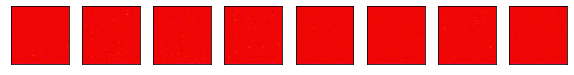

[Step 200] D Loss: 0.0000; G Loss: 0.0000


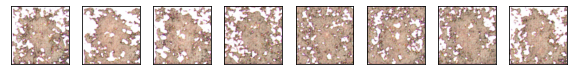

[Step 400] D Loss: 0.0000; G Loss: 0.0009


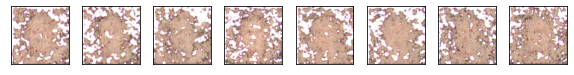

[Step 600] D Loss: 0.0851; G Loss: 0.0004


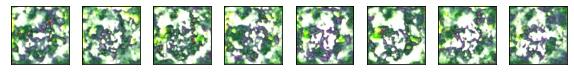

[Step 800] D Loss: 0.0000; G Loss: 0.0001


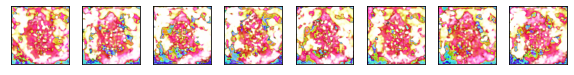

[Step 1000] D Loss: 0.0730; G Loss: 91.7970


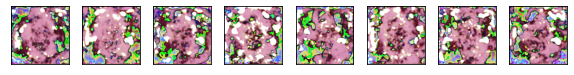

[Step 1200] D Loss: 2.3003; G Loss: 43.7784


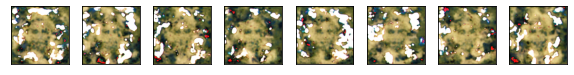

[Step 1400] D Loss: 1.8345; G Loss: 79.3035


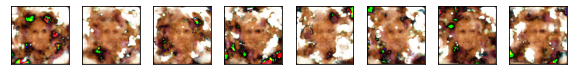

[Step 1600] D Loss: 0.5136; G Loss: 2.4976


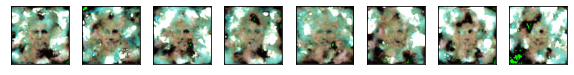

[Step 1800] D Loss: 2.8211; G Loss: 9.5840


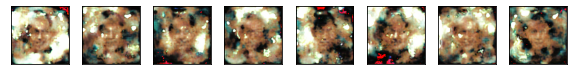

[Step 2000] D Loss: 0.6466; G Loss: 43.6125


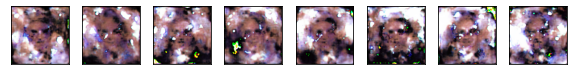

[Step 2200] D Loss: 0.3674; G Loss: 11.4697


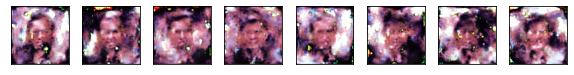

[Step 2400] D Loss: 0.2858; G Loss: 21.4283


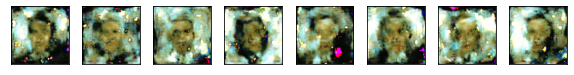

[Step 2600] D Loss: 0.6409; G Loss: 37.9281


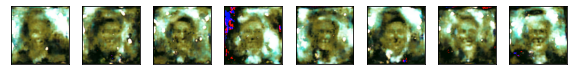

[Step 2800] D Loss: 0.0000; G Loss: 21.3792


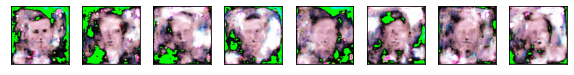

[Step 3000] D Loss: 0.0000; G Loss: 5.5908


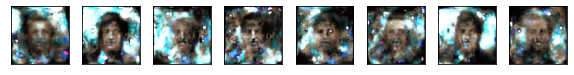

[Step 3200] D Loss: 1.0059; G Loss: 0.7309


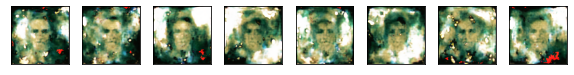

[Step 3400] D Loss: 0.0614; G Loss: 27.7456


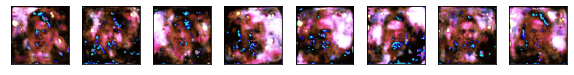

[Step 3600] D Loss: 0.0095; G Loss: 4.9185


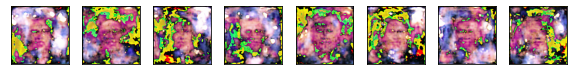

[Step 3800] D Loss: 0.7566; G Loss: 4.1168


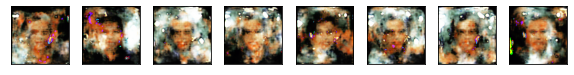

[Step 4000] D Loss: 1.1758; G Loss: 3.5277


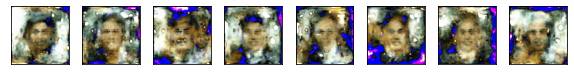

[Step 4200] D Loss: 0.8577; G Loss: 3.6854


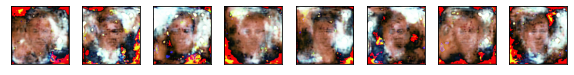

[Step 4400] D Loss: 8.2094; G Loss: 10.6173


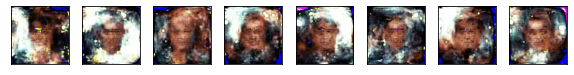

[Step 4600] D Loss: 0.6797; G Loss: 10.9594


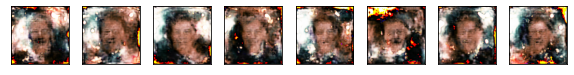

[Step 4800] D Loss: 3.7113; G Loss: 13.0663


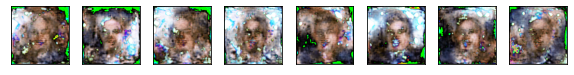

[Step 5000] D Loss: 0.0000; G Loss: 0.2077


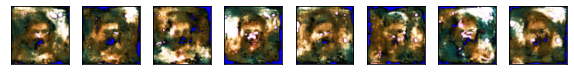

[Step 5200] D Loss: 0.5171; G Loss: 1.7890


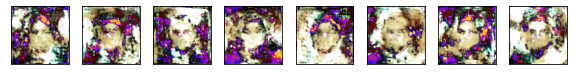

[Step 5400] D Loss: 1.2286; G Loss: 5.4713


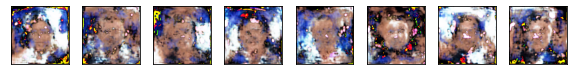

[Step 5600] D Loss: 0.7258; G Loss: 7.0945


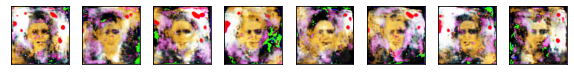

[Step 5800] D Loss: 0.1150; G Loss: 2.0147


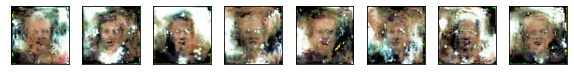

[Step 6000] D Loss: 0.0640; G Loss: 23.1605


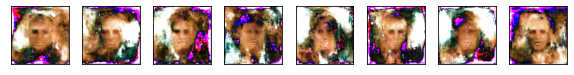

[Step 6200] D Loss: 0.0008; G Loss: 1.2014


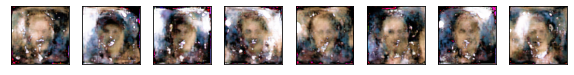

[Step 6400] D Loss: 2.0764; G Loss: 48.4963


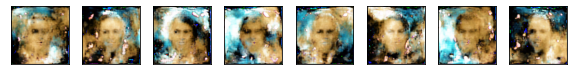

[Step 6600] D Loss: 2.3596; G Loss: 29.6898


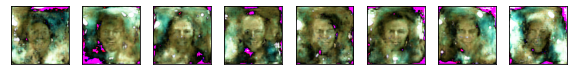

[Step 6800] D Loss: 2.0426; G Loss: 4.4527


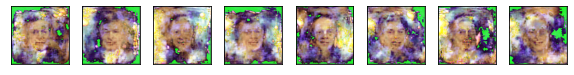

[Step 7000] D Loss: 0.8683; G Loss: 13.7561


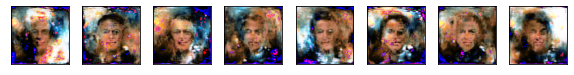

[Step 7200] D Loss: 0.8388; G Loss: 6.6774


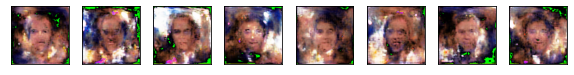

[Step 7400] D Loss: 1.2324; G Loss: 5.5324


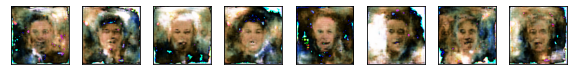

[Step 7600] D Loss: 1.3695; G Loss: 2.1891


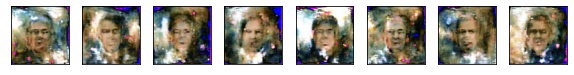

[Step 7800] D Loss: 0.4631; G Loss: 0.0661


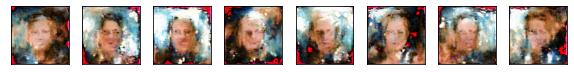

[Step 8000] D Loss: 0.0210; G Loss: 8.7389


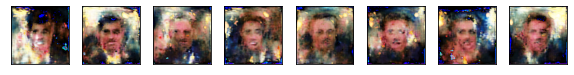

[Step 8200] D Loss: 1.4150; G Loss: 4.9931


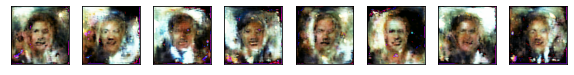

[Step 8400] D Loss: 2.2330; G Loss: 4.4632


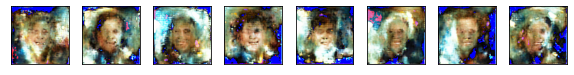

[Step 8600] D Loss: 1.3612; G Loss: 7.5049


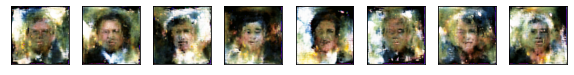

[Step 8800] D Loss: 3.8083; G Loss: 6.2351


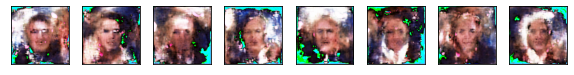

[Step 9000] D Loss: 0.5548; G Loss: 13.1280


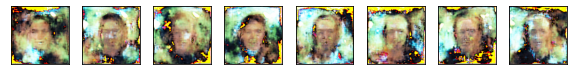

[Step 9200] D Loss: 0.2623; G Loss: 11.5918


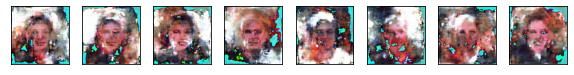

[Step 9400] D Loss: 0.0386; G Loss: 13.3099


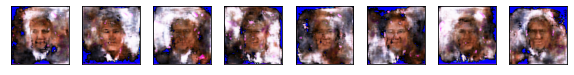

[Step 9600] D Loss: 0.4148; G Loss: 7.5614


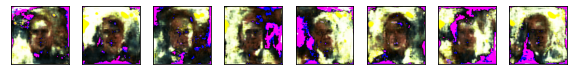

[Step 9800] D Loss: 0.8186; G Loss: 0.4072


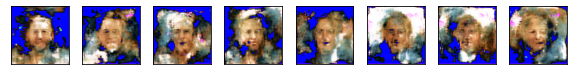

[Step 10000] D Loss: 0.6669; G Loss: 1.8687


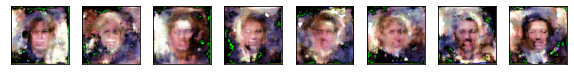

[Step 10200] D Loss: 1.9053; G Loss: 26.7398


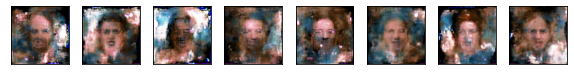

[Step 10400] D Loss: 0.0000; G Loss: 6.6783


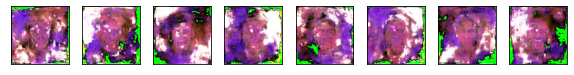

[Step 10600] D Loss: 3.6953; G Loss: 2.1782


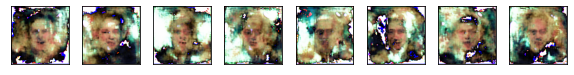

[Step 10800] D Loss: 2.1708; G Loss: 4.7386


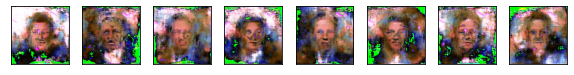

[Step 11000] D Loss: 0.6534; G Loss: 8.6222


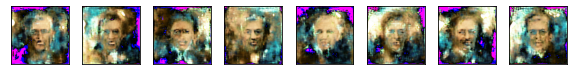

[Step 11200] D Loss: 0.7818; G Loss: 5.6159


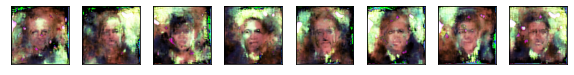

[Step 11400] D Loss: 1.3957; G Loss: 3.5487


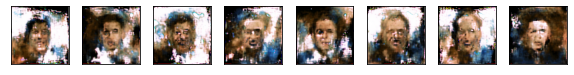

[Step 11600] D Loss: 1.1646; G Loss: 4.2529


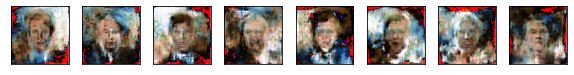

[Step 11800] D Loss: 1.6638; G Loss: 2.7004


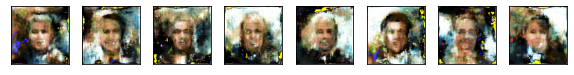

[Step 12000] D Loss: 1.0182; G Loss: 0.7388


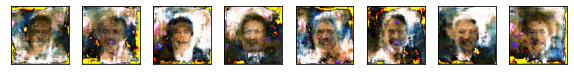

[Step 12200] D Loss: 0.6693; G Loss: 1.5294


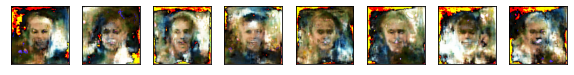

[Step 12400] D Loss: 0.6865; G Loss: 0.2801


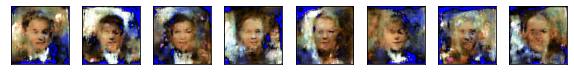

[Step 12600] D Loss: 6.5499; G Loss: 0.6765


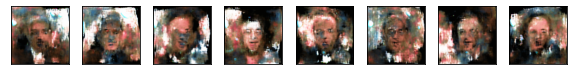

[Step 12800] D Loss: 0.2528; G Loss: 5.9861


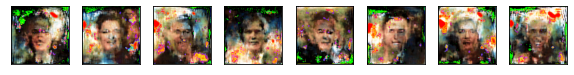

[Step 13000] D Loss: 6.0783; G Loss: 7.4044


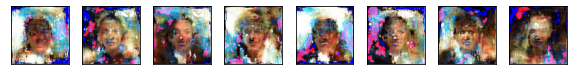

[Step 13200] D Loss: 0.8003; G Loss: 3.2376


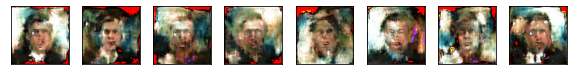

[Step 13400] D Loss: 0.5183; G Loss: 9.2661


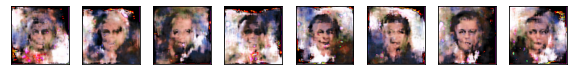

[Step 13600] D Loss: 0.5527; G Loss: 5.3561


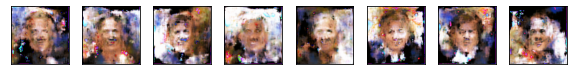

[Step 13800] D Loss: 0.7690; G Loss: 6.1059


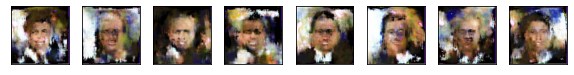

[Step 14000] D Loss: 0.8409; G Loss: 1.6755


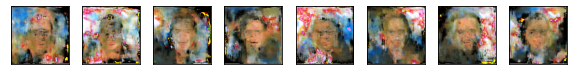

[Step 14200] D Loss: 0.1857; G Loss: 0.9628


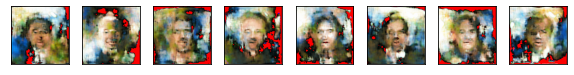

[Step 14400] D Loss: 0.3622; G Loss: 0.0453


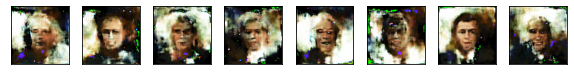

[Step 14600] D Loss: 0.0975; G Loss: 3.9086


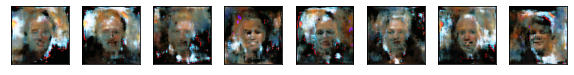

[Step 14800] D Loss: 0.1566; G Loss: 2.5911


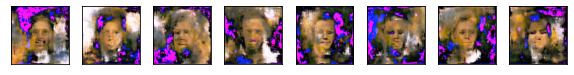

[Step 15000] D Loss: 0.9903; G Loss: 1.8410


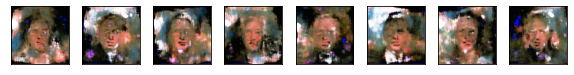

[Step 15200] D Loss: 0.7755; G Loss: 9.7103


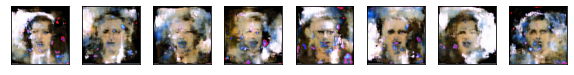

[Step 15400] D Loss: 0.6398; G Loss: 2.1311


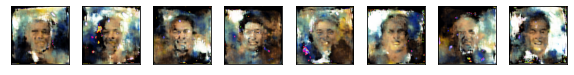

[Step 15600] D Loss: 0.6859; G Loss: 3.8214


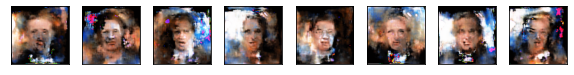

[Step 15800] D Loss: 0.3963; G Loss: 6.6810


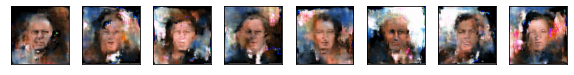

[Step 16000] D Loss: 1.3639; G Loss: 5.6700


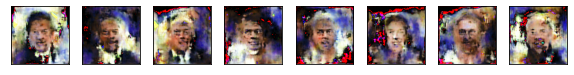

[Step 16200] D Loss: 1.6098; G Loss: 2.9469


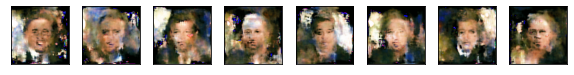

[Step 16400] D Loss: 3.4975; G Loss: 1.5230


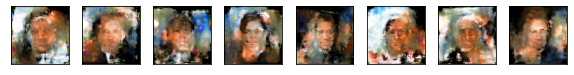

[Step 16600] D Loss: 0.6291; G Loss: 5.7695


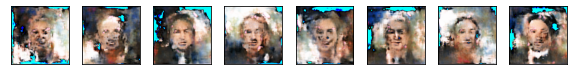

[Step 16800] D Loss: 0.0791; G Loss: 8.9839


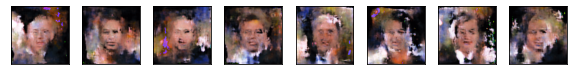

[Step 17000] D Loss: 0.0804; G Loss: 5.1732


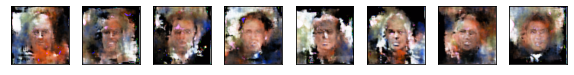

[Step 17200] D Loss: 0.1596; G Loss: 5.4487


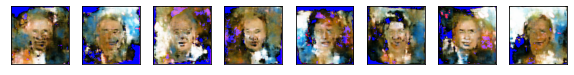

[Step 17400] D Loss: 0.3950; G Loss: 1.4625


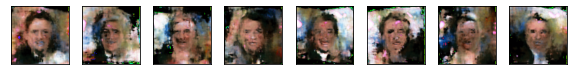

[Step 17600] D Loss: 3.0409; G Loss: 7.1251


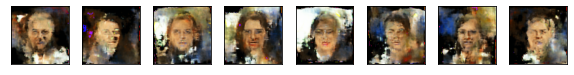

[Step 17800] D Loss: 1.0551; G Loss: 11.6949


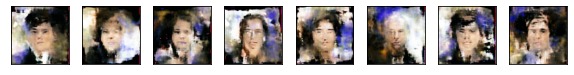

[Step 18000] D Loss: 0.7467; G Loss: 5.5934


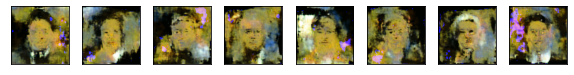

[Step 18200] D Loss: 0.2071; G Loss: 17.5955


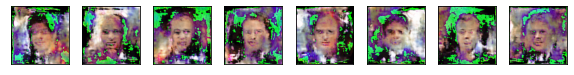

[Step 18400] D Loss: 0.4006; G Loss: 5.7291


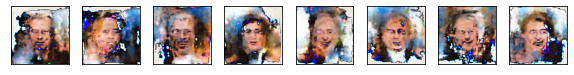

[Step 18600] D Loss: 0.6494; G Loss: 2.3498


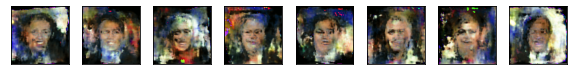

[Step 18800] D Loss: 1.3456; G Loss: 4.4086


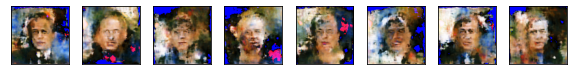

[Step 19000] D Loss: 1.4197; G Loss: 6.2524


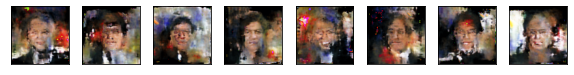

[Step 19200] D Loss: 0.4762; G Loss: 1.1434


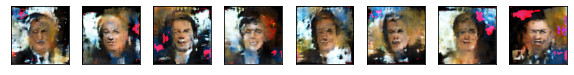

[Step 19400] D Loss: 0.7859; G Loss: 8.4942


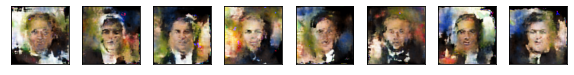

[Step 19600] D Loss: 0.6441; G Loss: 7.5085


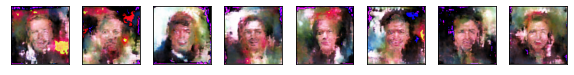

[Step 19800] D Loss: 1.9216; G Loss: 6.7565


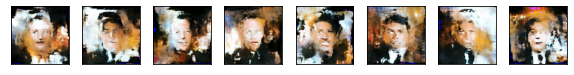

[Step 20000] D Loss: 0.0752; G Loss: 9.6562


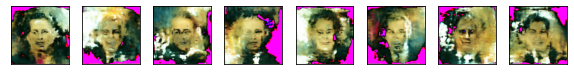

[Step 20200] D Loss: 0.6264; G Loss: 5.0126


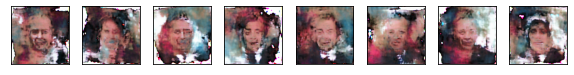

[Step 20400] D Loss: 0.9825; G Loss: 5.8903


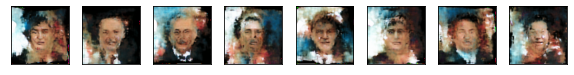

[Step 20600] D Loss: 0.7408; G Loss: 3.1189


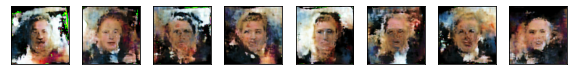

[Step 20800] D Loss: 1.8470; G Loss: 8.2180


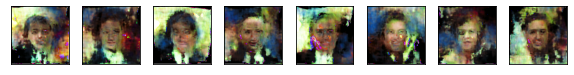

[Step 21000] D Loss: 0.9423; G Loss: 2.8145


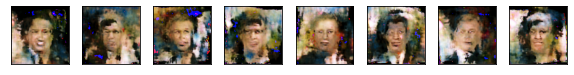

[Step 21200] D Loss: 0.6237; G Loss: 2.0948


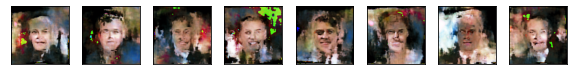

[Step 21400] D Loss: 0.5138; G Loss: 9.5816


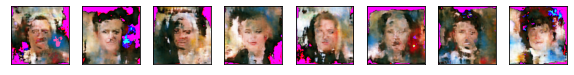

[Step 21600] D Loss: 0.6975; G Loss: 0.5205


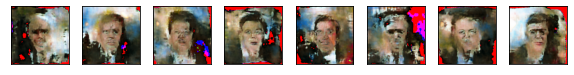

[Step 21800] D Loss: 1.2726; G Loss: 2.2731


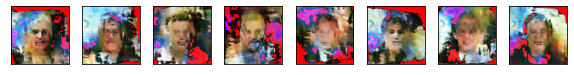

[Step 22000] D Loss: 0.1350; G Loss: 5.4054


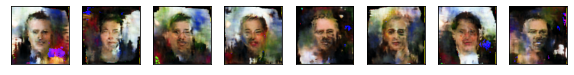

[Step 22200] D Loss: 0.8020; G Loss: 1.2450


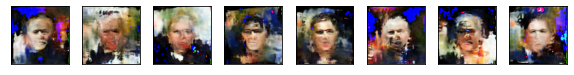

[Step 22400] D Loss: 0.3659; G Loss: 3.9495


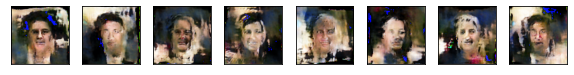

[Step 22600] D Loss: 1.2276; G Loss: 2.0840


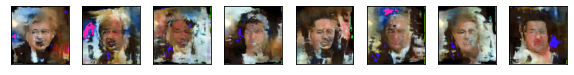

[Step 22800] D Loss: 0.3955; G Loss: 9.1742


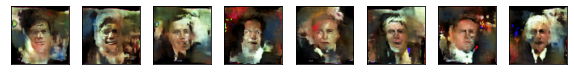

[Step 23000] D Loss: 0.2627; G Loss: 5.6437


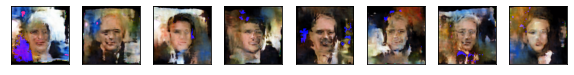

[Step 23200] D Loss: 0.9080; G Loss: 4.4731


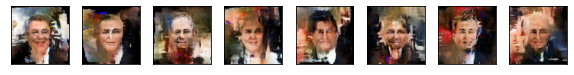

[Step 23400] D Loss: 0.2868; G Loss: 1.3837


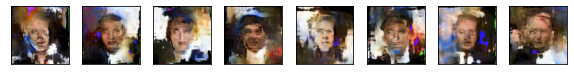

[Step 23600] D Loss: 0.4629; G Loss: 5.3680


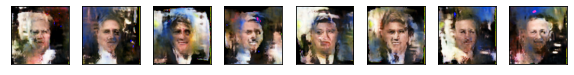

[Step 23800] D Loss: 0.5434; G Loss: 8.4432


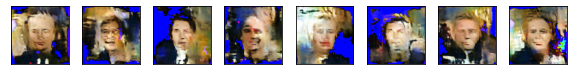

[Step 24000] D Loss: 0.2570; G Loss: 3.7361


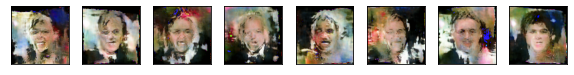

[Step 24200] D Loss: 0.6627; G Loss: 11.4477


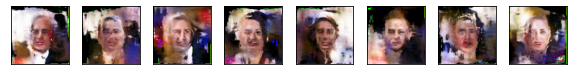

[Step 24400] D Loss: 0.1848; G Loss: 5.8856


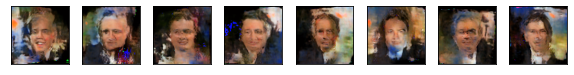

[Step 24600] D Loss: 0.3928; G Loss: 3.0006


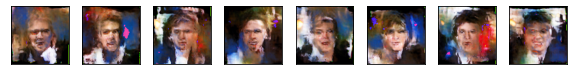

KeyboardInterrupt: ignored

In [ ]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1)), 
        np.zeros((HALF_BATCH_SIZE, 1))))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = tf.compat.v1.losses.sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1))
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = tf.compat.v1.losses.sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 200 == 0:
        print("[Step %2d] D Loss: %.4f; G Loss: %.4f" % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_digits(syntetic_images)


In [ ]:
discriminator.save_weights('/content/discriminator.h5')
generator.save_weights('/content/generator.h5')



In [ ]:
discriminator.save('/content/discriminator.h5')
generator.save('/content/generator.h5')

## Generator test: random examples

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


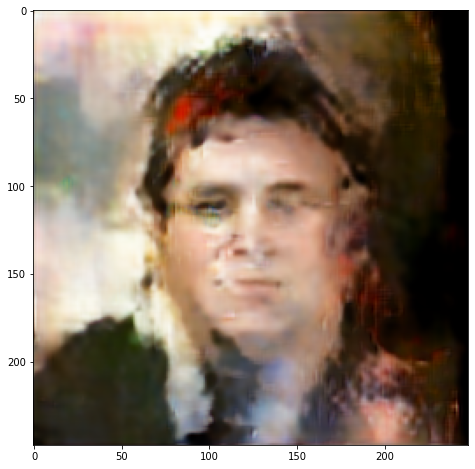

In [ ]:
noise = np.random.normal(0, 1, (2, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plt.figure(figsize=(8,8))
plt.imshow(syntetic_images[0])
plt.show()
#plot_digits(syntetic_images)

## Generator test: continuous examples

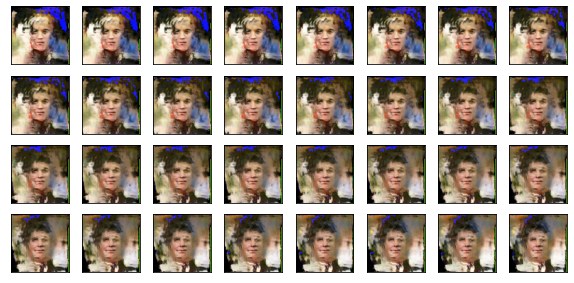

In [ ]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 32)
syntetic_images = generator.predict(noise)
plot_digits(syntetic_images)

In [ ]:
# больше примеров можно найти тут https://github.com/eriklindernoren/Keras-GAN